### `exploration_03.ipynb`

Last updated: 10/29/23

Trying out a bunch of different clustering methods of outputs of DeepPhase network

In [23]:
## Import packages and modules
import os
import sys

main_path = "/Genomics/argo/users/tt1131/dp_vq_code/"
import torch
torch.set_float32_matmul_precision('medium')

sys.path.append(main_path)
sys.path.append(os.path.join(main_path, "expts/fly/"))

import numpy as np
from einops import rearrange

from base.utils import *
from data_module_re import *
from deep_phase_re import *  

import pytorch_lightning as pl
from pytorch_lightning import seed_everything
from sklearn.decomposition import PCA

## Set random seed
seed = 42
seed_everything(seed, workers=True)
rs = np.random.RandomState(seed)

from matplotlib import cm

states_c_dict = {
    1: cm.tab20c(4),
    2: cm.tab20c(5),
    7: cm.tab20c(0), 
    9: cm.tab20c(1), 
    10: cm.tab20c(2),
    16: cm.tab20c(8),
    18: cm.tab20c(12),
}

Global seed set to 42


In [24]:
def butter_pass(pass_type, data, cutoff, fs, order, axis = 0):
    from scipy.signal import butter, filtfilt
    
    b, a = butter(order, cutoff / (fs * .5), btype=pass_type, analog=False)
    joints_pass = []
    for idx, seg in enumerate(data):
        joints_pass.append(filtfilt(b, a, seg, axis = axis))
    return np.array(joints_pass, dtype=object)

## Dataset Parameters
intvl_size = 1
fs = 100
cutoff = 1
order = 3
num_workers = 10
test_size = .2

epochs = 40
num_joints = 62
in_channels = num_joints
out_channels = num_joints // 2

## Model Parameters
window_size = 39
lr = 1e-4
batch_size = 32
latent_channels = 1

## States and Joints
joints_seg = np.load(
    os.path.join(main_path, "expts/datasets/fly/joints_102723.npy"),
    allow_pickle=True,
)
states = np.load(
    os.path.join(main_path, "expts/datasets/fly/states_102723.npy"),
    allow_pickle=True,
)

lc_hp_joints = butter_pass("hp", joints_seg, cutoff = cutoff, 
                            fs = fs, order = order, axis = 0)

dm = dp_dm(
    lc_hp_joints,
    states,
    batch_size,
    window_size,
    intvl_size,
    num_workers,
    test_size,
    rs
)
dm.setup()

In [25]:
from pathlib import Path
num_channels = 8
model_path = list(Path(f"/Genomics/argo/users/tt1131/dp_vq_code/expts_wandb/fly-231028/expt-{num_channels}").glob("*"))[0].as_posix()
model = deep_phase.load_from_checkpoint(model_path)
model.freeze()

val_trainer = pl.Trainer(
    enable_progress_bar = True,
    deterministic = True,
    accelerator = 'gpu', 
    devices = -1
)

val_predicted = val_trainer.predict(model, dm.val_dataloader())

/Genomics/argo/users/tt1131/miniconda3/envs/deepphase/lib/python3.8/site-packages/lightning_fabric/plugins/environments/slurm.py:166: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /Genomics/argo/users/tt1131/miniconda3/envs/deepphas ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

In [26]:
out_list = []

out_dict = {
    "input": [], "latents": [], "recr": [], "L": [],
    "f": [], "a": [], "b": [], "s": [],
    "state": [], "m": []
}
    
for items in val_predicted:
    for key, i in zip(list(out_dict.keys()), items):
        out_dict[key].append(i.detach().cpu().numpy())

for key, item in out_dict.items():
    out_dict[key] = np.concatenate(item).squeeze()
    print(key, out_dict[key].shape)

input (16135, 39, 62)
latents (16135, 8, 39)
recr (16135, 39, 62)
L (16135, 8, 39)
f (16135, 8)
a (16135, 8)
b (16135, 8)
s (16135, 8)
state (16135,)
m (16135, 8, 20)


In [27]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

In [28]:
def rephase(f, a, p, b, tpi, args):
    ## To scale everything to 0, negative of original phase
    return torch.tensor(a * np.sin(tpi * (f * args)) + b).float()

def rephase_decode(num_channels, f, a, p, b, tpi, args, decoder):
    ## only for one sample
    if num_channels == 1:
        re_p = rephase(f, a, p, b, tpi, args)
        re_p_torch = torch.tensor(re_p).float()
        if len([*re_p_torch]) >= 2:
            re_p_torch = re_p_torch.unsqueeze(1)
        else:
            re_p_torch = re_p_torch.unsqueeze(0).unsqueeze(0)
        return decoder(re_p_torch).detach().cpu().numpy()
    else:
        re_p_all = []
        for nc in range(num_channels):
            re_p = rephase(f[nc], a[nc], p[nc], b[nc], tpi, args)
            re_p_torch = torch.tensor(re_p).float()
            re_p_all.append(re_p_torch[:, np.newaxis])
            
        latent_full = torch.concat(re_p_all, axis = 1).T.unsqueeze(0)
        return latent_full, decoder(latent_full).detach().cpu().numpy()

In [29]:
tpi = model.tpi.detach().cpu().numpy()
args = model.args.detach().cpu().numpy()

rephased_L = []
rephased_out = []

for f, a, b, s in zip(out_dict['f'], out_dict['a'], out_dict['s'], out_dict['b']):
    rp_L, rp_out = rephase_decode(num_channels, f, a, b, s, tpi, args, model._decoder)
    rephased_L.append(rp_L)
    rephased_out.append(rp_out)

rephased_out = np.stack(rephased_out).squeeze()
rephased_L = np.stack(rephased_L).squeeze()

/tmp/ipykernel_3425387/636191786.py:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  re_p_torch = torch.tensor(re_p).float()


In [30]:
input_stacked = rearrange(out_dict['input'], "n t j -> n (t j)")
recr_stacked = rearrange(out_dict['recr'], "n t j -> n (t j)")
reph_stacked = rearrange(rephased_out, "n t j -> n (t j)")

recr_L = rearrange(out_dict["L"], 'n t j -> n (t j)')
reph_L = rearrange(rephased_L, 'n t j -> n (t j)')

In [31]:
def gen_segments(
    joints_l: np.ndarray, states: np.ndarray, window_size: int
):
    """Break time series joint data to segments of windows size for
    model inputs

    Args:
        joints_l (np.ndarray): Low-pass joint data with shape (length, num_joints)
        states (np.ndarray): TSNE-states from dataset
        seg_r (int): Length of all small video segments
        motion_init (Boolean): Whether to minus each small segment from the first frames
        window_size (int): window size

    Returns:
        joints_l_np (np.array): joints array with shape
        (seg per video * total number of videos, window size, num_joints)
        joints_h_np (np.array): joints array with shape
        (seg per video * total number of videos, window size, num_joints)
        states_np (np.array): states array with shape
        (seg per video * total number of videos, 1)
    """
    w_joint_list_l = []
    w_states_list = []    
    for (jl, state) in zip(joints_l, states):
        start_list = np.arange(0, jl.shape[0] - window_size + 1)
        w_seg_l = np.array([jl[start : start + window_size] for start in start_list])
        w_joint_list_l.append(w_seg_l)
        w_states_list.append(np.full((w_seg_l.shape[0], 1), state))

    return (
        np.concatenate(w_joint_list_l),
        np.concatenate(w_states_list)
    )

In [32]:
def gen_segments_new(
    joints_l: np.ndarray, states: np.ndarray, window_size: int
):
    """Break time series joint data to segments of windows size for
    model inputs

    Args:
        joints_l (np.ndarray): Low-pass joint data with shape (length, num_joints)
        states (np.ndarray): TSNE-states from dataset
        seg_r (int): Length of all small video segments
        motion_init (Boolean): Whether to minus each small segment from the first frames
        window_size (int): window size

    Returns:
        joints_l_np (np.array): joints array with shape
        (seg per video * total number of videos, window size, num_joints)
        joints_h_np (np.array): joints array with shape
        (seg per video * total number of videos, window size, num_joints)
        states_np (np.array): states array with shape
        (seg per video * total number of videos, 1)
    """
    w_joint_list_l = []
    w_states_list = []
    w_lengths = []
    

    for (jl, state) in zip(joints_l, states):
        start_list = np.arange(0, jl.shape[0] - window_size + 1)
        w_seg_l = np.array([jl[start : start + window_size] for start in start_list])
        w_joint_list_l.append(w_seg_l)
        w_lengths.append(start_list.shape[0])
        w_states_list.append(np.full((w_seg_l.shape[0], 1), state))

    return (
        np.concatenate(w_joint_list_l),
        np.concatenate(w_states_list),
        np.array(w_lengths)
    )

In [33]:
## Doing PCA here
out_L = rearrange(out_dict["L"], "n l t -> n (l t)")

from sklearn.decomposition import PCA

pca = PCA(n_components = 15)
lowd_L = pca.fit_transform(out_L)

In [34]:
from mpl_toolkits.mplot3d import Axes3D

In [35]:
lc_lp_joints = butter_pass("lp", joints_seg, cutoff = cutoff, 
                            fs = fs, order = order, axis = 0)

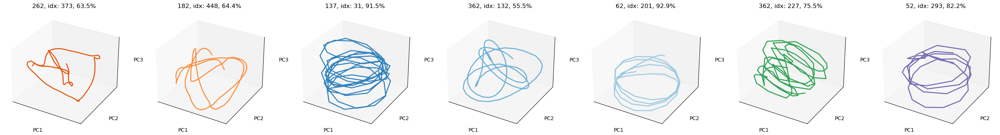

<Figure size 640x480 with 0 Axes>

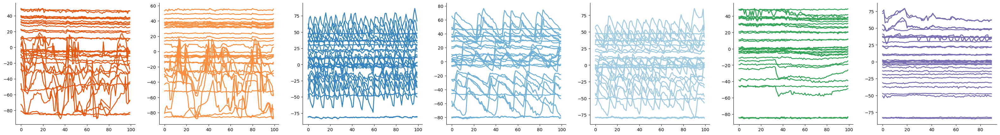

<Figure size 640x480 with 0 Axes>

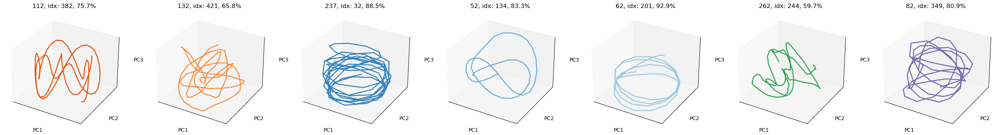

<Figure size 640x480 with 0 Axes>

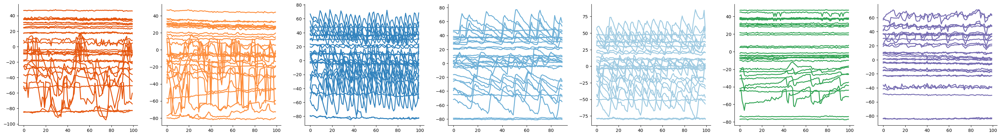

<Figure size 640x480 with 0 Axes>

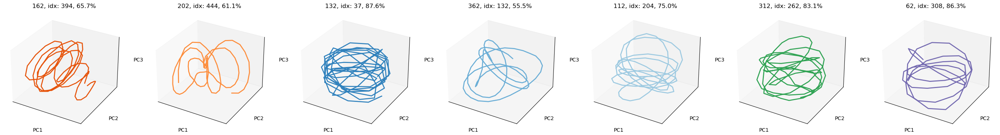

<Figure size 640x480 with 0 Axes>

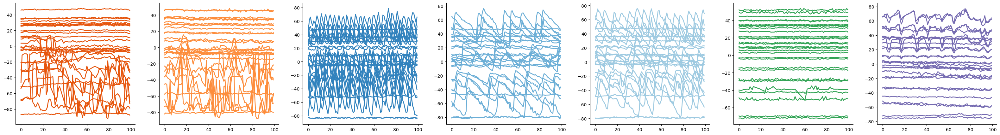

<Figure size 640x480 with 0 Axes>

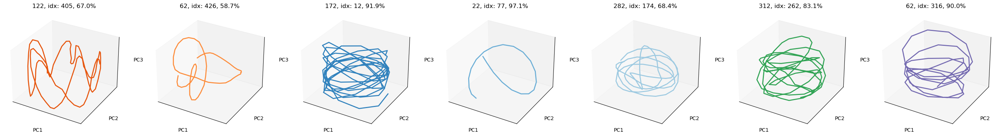

<Figure size 640x480 with 0 Axes>

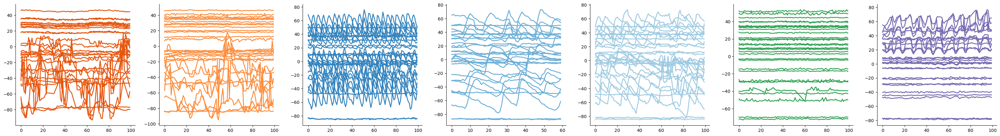

<Figure size 640x480 with 0 Axes>

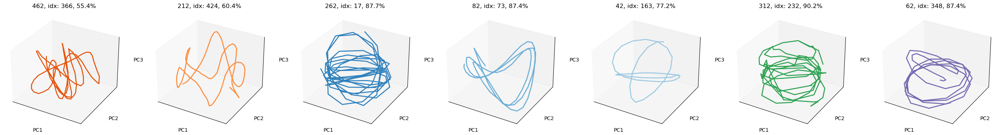

<Figure size 640x480 with 0 Axes>

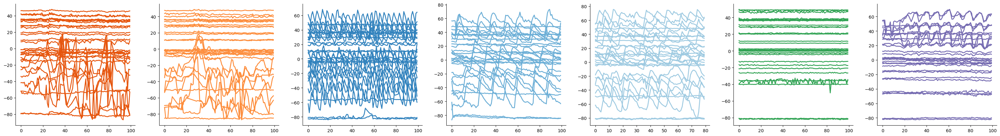

<Figure size 640x480 with 0 Axes>

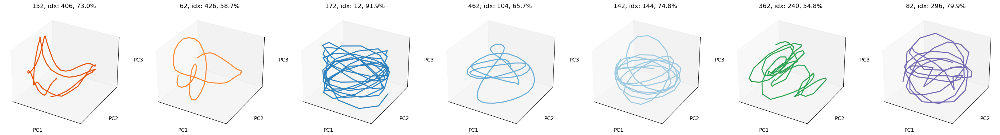

<Figure size 640x480 with 0 Axes>

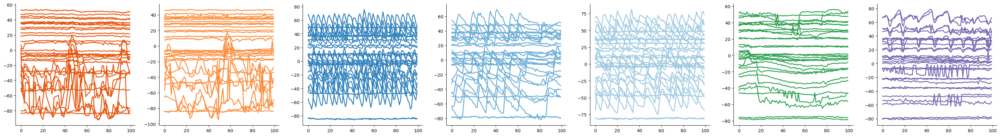

<Figure size 640x480 with 0 Axes>

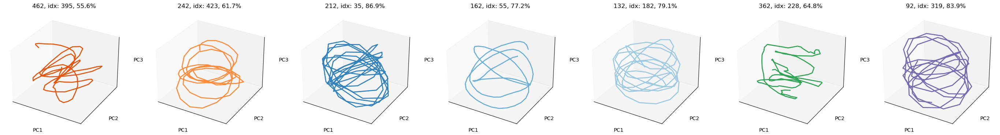

<Figure size 640x480 with 0 Axes>

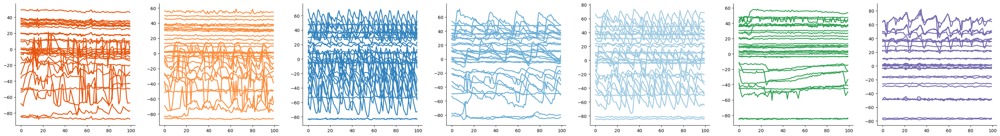

<Figure size 640x480 with 0 Axes>

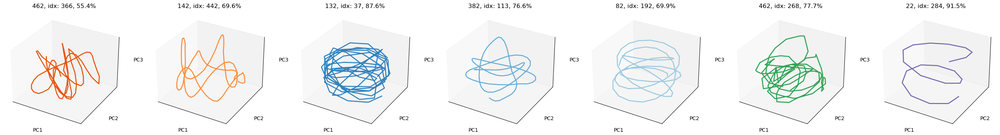

<Figure size 640x480 with 0 Axes>

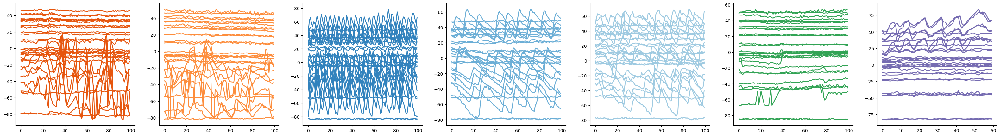

<Figure size 640x480 with 0 Axes>

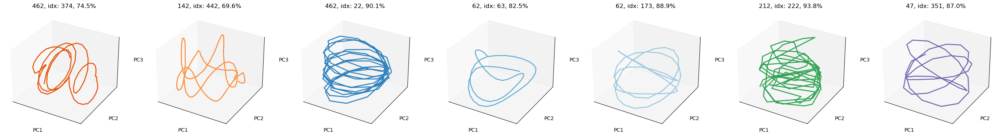

<Figure size 640x480 with 0 Axes>

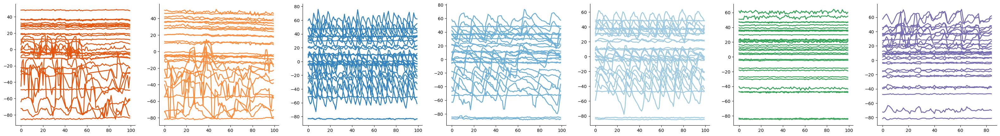

ValueError: n_components=5 must be between 0 and min(n_samples, n_features)=2 with svd_solver='full'

<Figure size 640x480 with 0 Axes>

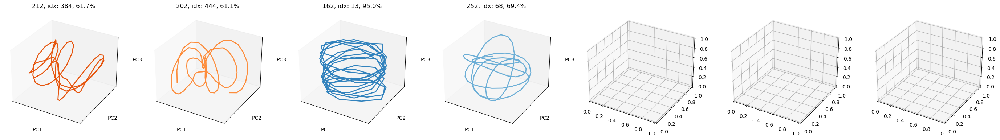

In [14]:
# sns.set_style("whitegrid")
target_states = np.unique(states.flatten())
forward_seg = 100


for r in np.arange(20):
    all_joints_seg = []
    lp_joints_seg = []
    
    fig = plt.figure(figsize=(len(target_states) * 5, 5))
    axs = fig.subplots(1, len(target_states), subplot_kw={'projection': '3d'})
    for state, ax in zip(target_states, axs.flatten()):
        state_idx_list = np.where(states == state)[0]
        seq_idx = np.random.choice(state_idx_list, 1)
        pca_obj = PCA(n_components=5, whiten=True)
        
        lc_hp_select = lc_hp_joints[seq_idx]
        lc_lp_select = lc_lp_joints[seq_idx]
        lp_ws = lc_lp_joints[seq_idx]
        
        all_joints_seg.append(lc_hp_select[0])
        lp_joints_seg.append(lc_lp_select[0])

        windowed_l, windowed_states = gen_segments(lc_hp_select, [[7]], 39)
        _, _, _, params, m = model.forward(torch.tensor(windowed_l[: forward_seg, ...]).float())

        a = params[1].squeeze().detach().cpu().numpy()
        b = params[2].squeeze().detach().cpu().numpy()
        p = params[3].squeeze().detach().cpu().numpy()

        m_x = a * np.sin(2.0 * np.pi * p) + b
        m_y = a * np.cos(2.0 * np.pi * p) + b

        manifold = np.hstack((m_x, m_y))
        y = pca_obj.fit_transform(manifold)
        var_exp_3d = np.cumsum(pca_obj.explained_variance_ratio_)[2] * 100

        px = y[:, 0]
        py = y[:, 1]
        pz = y[:, 2]

        ax.plot(px, py, pz, c=states_c_dict[state], 
                lw=2, label=state_dict[state])
        # ax.set_title(f"{state_dict[state]}, idx: {seq_idx[0]}, {var_exp_3d :.1f}%")
        ax.set_title(f"{windowed_l.shape[0]}, idx: {seq_idx[0]}, {var_exp_3d :.1f}%")
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])
        
        ax.set_xlabel("PC1")
        ax.set_ylabel("PC2")
        ax.set_zlabel("PC3")
    sns.despine()
    plt.show()
    plt.clf()

    fig, axs = plt.subplots(1, len(target_states), figsize = (40, 5))
    for state, ax, plot_joints, lp in zip(target_states, axs.flatten(), all_joints_seg, lp_joints_seg):
        in_j_seg_r = rearrange(plot_joints, "t (j d) -> t j d", j = 31, d = 2)
        lp_r = rearrange(lp, "t (j d) -> t j d", j = 31, d = 2)
        ax.plot((lp_r + in_j_seg_r)[:100, :, 0], c=states_c_dict[state], lw=2)

    sns.despine()
    plt.show()
    plt.clf()

In [22]:
fig_path = "/Genomics/argo/users/tt1131/dp_vq_code/figures/"

(462, 39, 62) (100, 8)
(242, 39, 62) (100, 8)
(342, 39, 62) (100, 8)
(112, 39, 62) (100, 8)
(222, 39, 62) (100, 8)
(262, 39, 62) (100, 8)
(142, 39, 62) (100, 8)


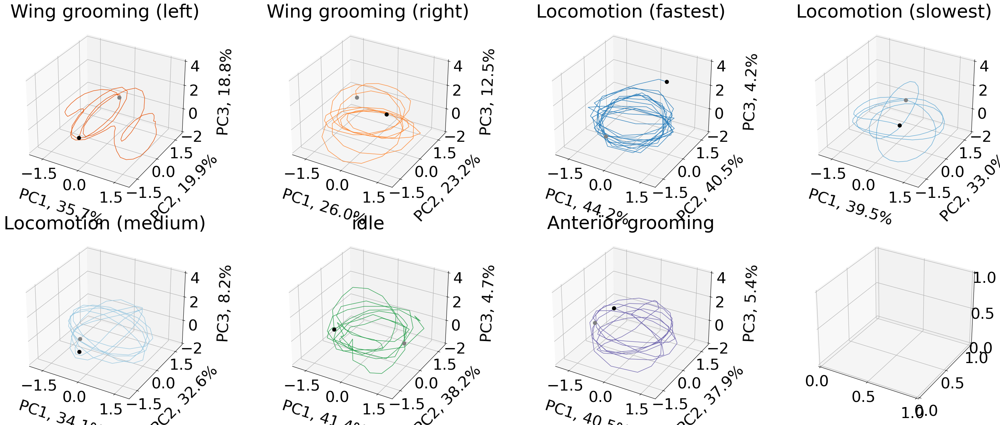

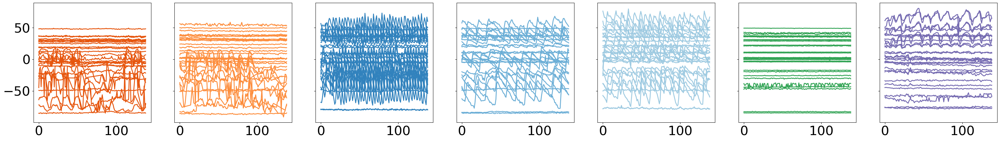

In [36]:
forward_seg = 100
target_states = np.unique(states.flatten())
plt.rcParams.update({'font.size': 30})

seq_idx_list = np.array([374, 423, 3, 74, 191, 258, 298])[:, None]
fig = plt.figure(figsize=(30, 12))
axs = fig.subplots(2, 4, 
                subplot_kw={'projection': '3d'})

forward_seg = 100
all_joints_seg = []
lp_joints_seg = []
var_exp_3d_list = []

for seq_idx, ax, state in zip(seq_idx_list, axs.flatten(), target_states):
    pca_obj = PCA(n_components=5, whiten=True)
    
    lc_hp_select = lc_hp_joints[seq_idx]
    lc_lp_select = lc_lp_joints[seq_idx]

    all_joints_seg.append(lc_hp_select[0])
    lp_joints_seg.append(lc_lp_select[0])

    windowed_l, windowed_states = gen_segments(lc_hp_select, [[7]], 39)
    
    _, _, _, params, m = model.forward(torch.tensor(windowed_l[: forward_seg, ...]).float())
    

    a = params[1].squeeze().detach().cpu().numpy()
    b = params[2].squeeze().detach().cpu().numpy()
    p = params[3].squeeze().detach().cpu().numpy()

    print(windowed_l.shape, a.shape)
    m_x = a * np.sin(2.0 * np.pi * p) + b
    m_y = a * np.cos(2.0 * np.pi * p) + b

    manifold = np.hstack((m_x, m_y))
    y = pca_obj.fit_transform(manifold)
    var_ratio = pca_obj.explained_variance_ratio_
    var_exp_3d_list.append(np.cumsum(pca_obj.explained_variance_ratio_)[2] * 100)

    px = y[:, 0]
    py = y[:, 1]
    pz = y[:, 2]

    ax.plot(px, py, pz, c=states_c_dict[state], lw=1, label=state_dict[state])

    ax.scatter(px[0], py[0], pz[0], c = "black", s = 50, label = "start")
    ax.scatter(px[-1], py[-1], pz[-1], c = "gray", s = 50, label = "end")
    
    ax.set_title(f"{state_dict[state]}")
    # ax.set_xticks([])
    # ax.set_yticks([])
    # ax.set_zticks([])

    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)
    ax.set_zlim(-2, 4)

    ax.set_xticks([-1.5, 0, 1.5])
    ax.set_yticks([-1.5, 0, 1.5])
    ax.set_zticks([-2, 0, 2, 4])
    
    ax.set_xlabel(f"PC1, {var_ratio[0] * 100 :.1f}%", labelpad=30)
    ax.set_ylabel(f"PC2, {var_ratio[1] * 100 :.1f}%", labelpad=30)
    ax.set_zlabel(f"PC3, {var_ratio[2] * 100 :.1f}%", labelpad=30)

plt.tight_layout()
plt.savefig(os.path.join(fig_path, "3D_manifold.svg"), dpi = 300, format = "svg", transparent = True)

fig, axs = plt.subplots(1, len(target_states), figsize = (40, 5), sharey = True)
for state, ax, plot_joints, lp in zip(target_states, axs.flatten(), all_joints_seg, lp_joints_seg):
    in_j_seg_r = rearrange(plot_joints, "t (j d) -> t j d", j = 31, d = 2)
    lp_r = rearrange(lp, "t (j d) -> t j d", j = 31, d = 2)
    ax.plot((lp_r + in_j_seg_r)[:forward_seg + 39 , :, 0], c=states_c_dict[state], lw=2)
plt.savefig(os.path.join(fig_path, "3D_manifold_corresponding_traj.svg"), dpi = 300, format = "svg", transparent = True)

In [37]:
np.average(var_exp_3d_list)

78.21691972868783

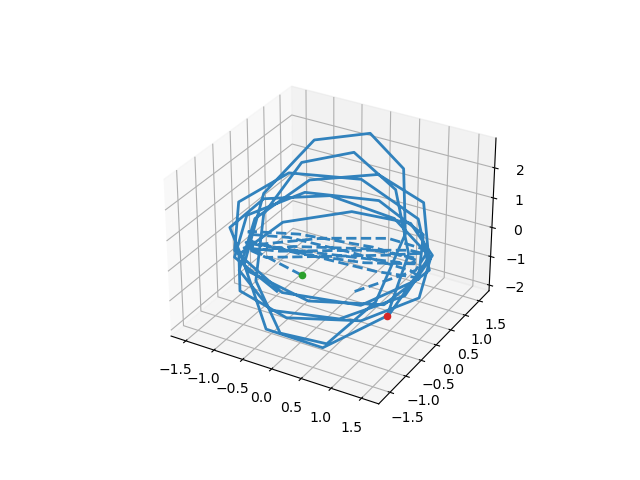

In [17]:
%matplotlib widget

seq_idx = [27]
state = 7

ax = plt.figure().add_subplot(projection='3d')

pca_obj = PCA(n_components=5, whiten=True)

lc_hp_select = lc_hp_joints[seq_idx]
lc_lp_select = lc_lp_joints[seq_idx]

all_joints_seg.append(lc_hp_select[0])
lp_joints_seg.append(lc_lp_select[0])

windowed_l, windowed_states = gen_segments(lc_hp_select, [[7]], 39)
_, _, _, params, m = model.forward(torch.tensor(windowed_l[: forward_seg, ...]).float())

a = params[1].squeeze().detach().cpu().numpy()
b = params[2].squeeze().detach().cpu().numpy()
p = params[3].squeeze().detach().cpu().numpy()

m_x = a * np.sin(2.0 * np.pi * p) + b
m_y = a * np.cos(2.0 * np.pi * p) + b

manifold = np.hstack((m_x, m_y))
y = pca_obj.fit_transform(manifold)
var_exp_3d = np.cumsum(pca_obj.explained_variance_ratio_)[2] * 100

px = y[:, 0]
py = y[:, 1]
pz = y[:, 2]

ax.scatter(px[0], py[0], pz[0], c = "tab:green", s = 20, label = "start")
ax.scatter(px[-1], py[-1], pz[-1], c = "tab:red", s = 20, label = "end")

ax.plot(px[:40], py[:40], pz[:40], c=states_c_dict[state], 
        lw=2, label=state_dict[state], ls = "--")

ax.plot(px[40:], py[40:], pz[40:], c=states_c_dict[state], 
        lw=2, label=state_dict[state])

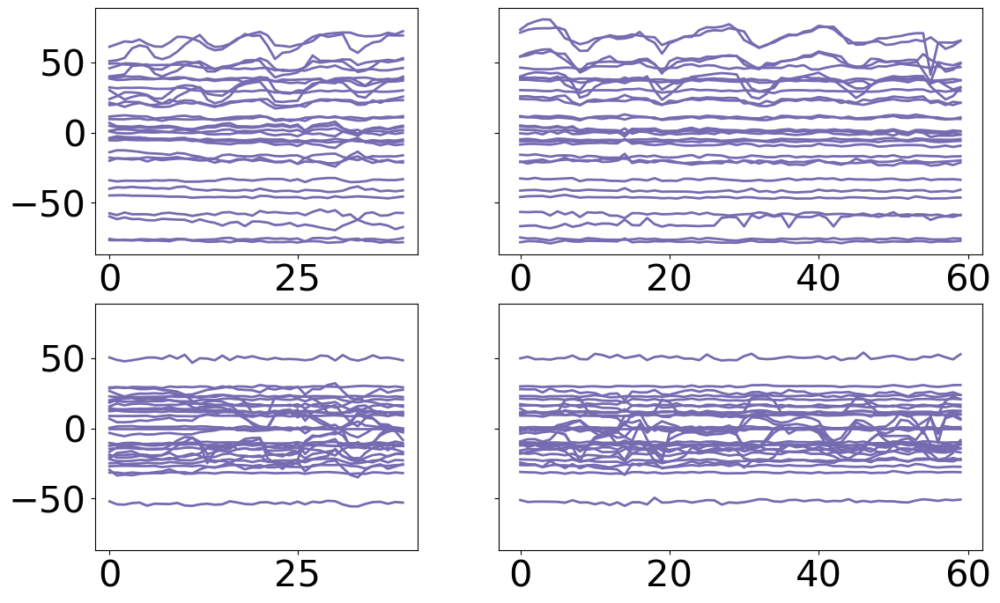

In [38]:
%matplotlib inline

fig, axs = plt.subplots(2, 2, figsize = (13, 8), sharey = True, gridspec_kw={'width_ratios': [2, 3]})

in_j_seg_r = rearrange(lc_hp_select[0], "t (j d) -> t j d", j = 31, d = 2)
lp_r = rearrange(lc_lp_select[0], "t (j d) -> t j d", j = 31, d = 2)

full_seg = lp_r + in_j_seg_r

axs[0, 0].plot(full_seg[:40, :, 0], c=states_c_dict[state], lw=2)
axs[0, 1].plot(full_seg[40: 100, :, 0], c=states_c_dict[state], lw=2)

axs[1, 0].plot(full_seg[:40, :, 1], c=states_c_dict[state], lw=2)
axs[1, 1].plot(full_seg[40: 100, :, 1], c=states_c_dict[state], lw=2);

In [39]:
fastest_state = 7
num_select = 50

state_idx_list = np.where(states == fastest_state)[0]

lc_hp_select = lc_hp_joints[state_idx_list]
lc_lp_select = lc_lp_joints[state_idx_list]

windowed_l, windowed_states, lengths = gen_segments_new(lc_hp_select, np.repeat(fastest_state, num_select), 39)
_, _, _, params, m = model.forward(torch.tensor(windowed_l).float())

lengths_idx = np.insert(np.cumsum(lengths), 0, 0)

a = params[1].squeeze().detach().cpu().numpy()
b = params[2].squeeze().detach().cpu().numpy()
p = params[3].squeeze().detach().cpu().numpy()

m_x = a * np.sin(2.0 * np.pi * p) + b
m_y = a * np.cos(2.0 * np.pi * p) + b

manifold = np.hstack((m_x, m_y))
y = pca_obj.fit_transform(manifold)
var_exp_3d = np.cumsum(pca_obj.explained_variance_ratio_)
[i * 100 for i in var_exp_3d[:3]]

[38.1159782409668, 75.19290447235107, 79.04518246650696]

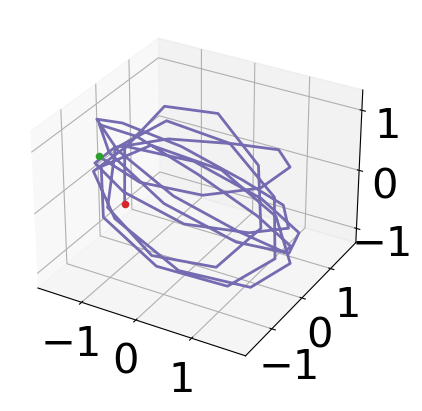

In [40]:
idx = 10

px = y[:, 0]
py = y[:, 1]
pz = y[:, 2]

start_idx = lengths_idx[idx]
end_idx = lengths_idx[idx + 1]

ax = plt.figure().add_subplot(projection='3d')

ax.scatter(px[start_idx], py[start_idx], pz[start_idx], c = "tab:green", s = 20, label = "start")
ax.scatter(px[end_idx - 1], py[end_idx - 1], pz[end_idx - 1], c = "tab:red", s = 20, label = "end")

ax.plot(px[start_idx: end_idx], py[start_idx: end_idx], pz[start_idx: end_idx], c=states_c_dict[state], 
        lw=2, label=state_dict[state])

In [41]:
windowed_l, windowed_states, lengths = gen_segments_new(lc_hp_joints, states, 39)
_, _, _, params, m = model.forward(torch.tensor(windowed_l).float())

lengths_idx = np.insert(np.cumsum(lengths), 0, 0)

a = params[1].squeeze().detach().cpu().numpy()
b = params[2].squeeze().detach().cpu().numpy()
p = params[3].squeeze().detach().cpu().numpy()

m_x = a * np.sin(2.0 * np.pi * p) + b
m_y = a * np.cos(2.0 * np.pi * p) + b

manifold = np.hstack((m_x, m_y))
y = pca_obj.fit_transform(manifold)
var_exp_3d = np.cumsum(pca_obj.explained_variance_ratio_)
[i * 100 for i in var_exp_3d[:3]]

[12.244303651303019, 24.11799028795219, 34.785372593991056]

In [42]:
for state in np.unique(states):
    state_idx_list = np.where(states == state)[0]

    lc_hp_select = lc_hp_joints[state_idx_list]
    lc_lp_select = lc_lp_joints[state_idx_list]

    windowed_l, windowed_states, lengths = gen_segments_new(lc_hp_select, np.repeat(fastest_state, num_select), 39)
    _, _, _, params, m = model.forward(torch.tensor(windowed_l).float())

    lengths_idx = np.insert(np.cumsum(lengths), 0, 0)

    a = params[1].squeeze().detach().cpu().numpy()
    b = params[2].squeeze().detach().cpu().numpy()
    p = params[3].squeeze().detach().cpu().numpy()

    m_x = a * np.sin(2.0 * np.pi * p) + b
    m_y = a * np.cos(2.0 * np.pi * p) + b

    manifold = np.hstack((m_x, m_y))
    y = pca_obj.fit_transform(manifold)
    var_exp_3d = np.cumsum(pca_obj.explained_variance_ratio_)
    print(state_dict[state], [i * 100 for i in var_exp_3d[:3]])

Wing grooming (left) [32.545268535614014, 48.411625623703, 59.81866121292114]
Wing grooming (right) [28.647828102111816, 49.63287115097046, 59.87488031387329]
Locomotion (fastest) [38.11611533164978, 75.19317865371704, 79.04546856880188]
Locomotion (slowest) [29.130801558494568, 53.51875424385071, 61.06862425804138]
Locomotion (medium) [24.178245663642883, 46.60530984401703, 56.35334253311157]
idle [28.886932134628296, 56.108611822128296, 62.968116998672485]
Anterior grooming [33.40325057506561, 65.72376489639282, 72.4033534526825]


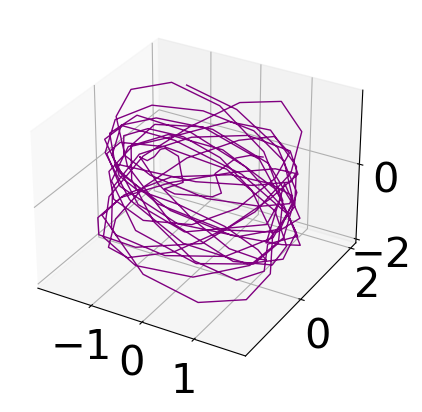

In [47]:
px = y[:200, 0]
py = y[:200, 1]
pz = y[:200, 2]

start_idx = lengths_idx[idx]
end_idx = lengths_idx[idx + 1]

ax = plt.figure().add_subplot(projection='3d')

ax.plot(px, py, pz, c = "purple", lw = 1)